In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

plt.rcParams['figure.dpi'] = 600
plt.rcParams['savefig.dpi'] = 600

sns.set_theme(style='darkgrid', palette='viridis', rc={
              "figure.dpi": 600, 'savefig.dpi': 600, 'figure.figsize': (11.7, 8.27)})

In [2]:
def plot_date_frequency(date_series):

    df = pd.DataFrame({'date': date_series})
    df['year'] = df['date'].dt.year
    df['month'] = df['date'].dt.month

    monthly_counts = df.groupby(
        ['year', 'month']).size().reset_index(name='count')

    sns_plot = sns.lineplot(
        data=monthly_counts,
        x='month',
        y='count',
        hue='year',
        marker='o',
        markers=True,
        dashes=False
    )

    plt.title('Monthly Frequency by Year', pad=20)
    plt.xlabel('Month')
    plt.ylabel('Frequency')

    month_labels = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun',
                    'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
    plt.xticks(range(1, 13), month_labels, rotation=45)

    plt.legend(title='Year', bbox_to_anchor=(1.05, 1), loc='upper left')

    plt.tight_layout()

    return plt.gcf()

In [3]:
fire_df = pd.read_csv('../assets/fire_locs.csv')
fire_df.head()

,_uid_,id,longitude,latitude,initialdate,days
0,16.0,966855.0,-2.107749e+06,1.663840e+06,2002-01-08,0
1,19.0,966859.0,-1.599552e+06,1.247091e+06,2002-01-08,7
2,19.0,966859.0,-1.599552e+06,1.247091e+06,2002-01-09,7
3,17.0,966856.0,-2.106833e+06,1.661532e+06,2002-01-10,0
4,19.0,966859.0,-1.599552e+06,1.247091e+06,2002-01-10,7


/tmp/ipykernel_187542/4199942070.py:1: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  plot_date_frequency(pd.to_datetime(fire_df['initialdate'])).show()


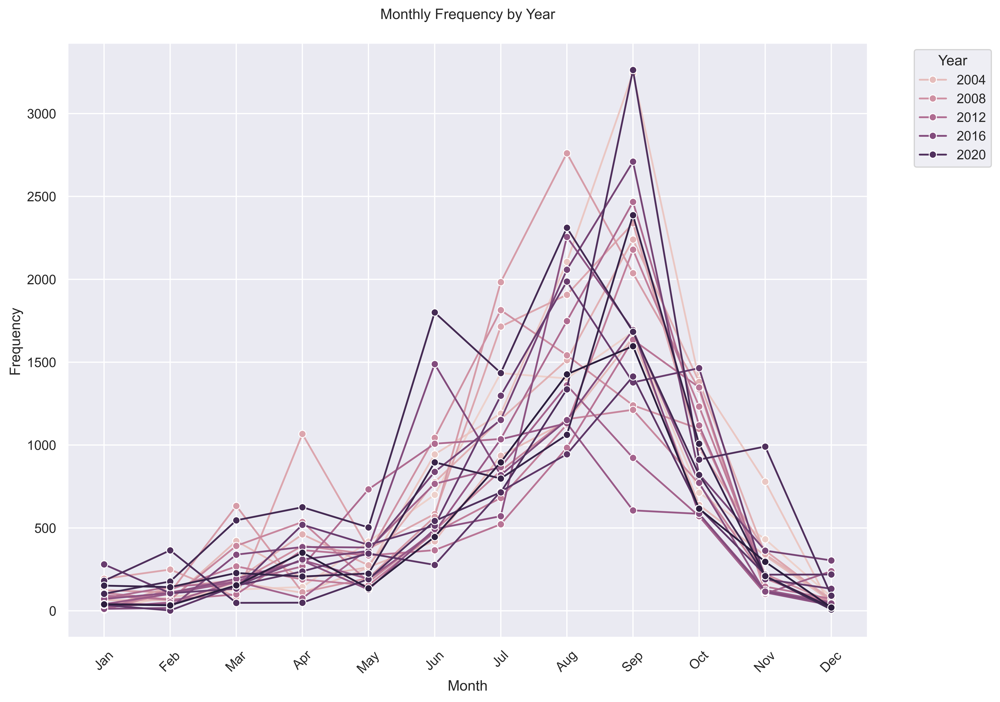

In [4]:
plot_date_frequency(pd.to_datetime(fire_df['initialdate'])).show()

In [5]:
ngs_df = pd.read_csv('../assets/negative_class_same_locations.csv')
ngs_df.head()

,_uid_,id,longitude,latitude,initialdate,days
0,16.0,966855.0,-2.107749e+06,1.663840e+06,2001-10-11,0
1,19.0,966859.0,-1.599552e+06,1.247091e+06,2001-10-26,7
2,19.0,966859.0,-1.599552e+06,1.247091e+06,2001-11-23,7
3,17.0,966856.0,-2.106833e+06,1.661532e+06,2001-10-21,0
4,19.0,966859.0,-1.599552e+06,1.247091e+06,2001-11-09,7


/tmp/ipykernel_187542/2279835341.py:1: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  plot_date_frequency(pd.to_datetime(ngs_df['initialdate'])).show()


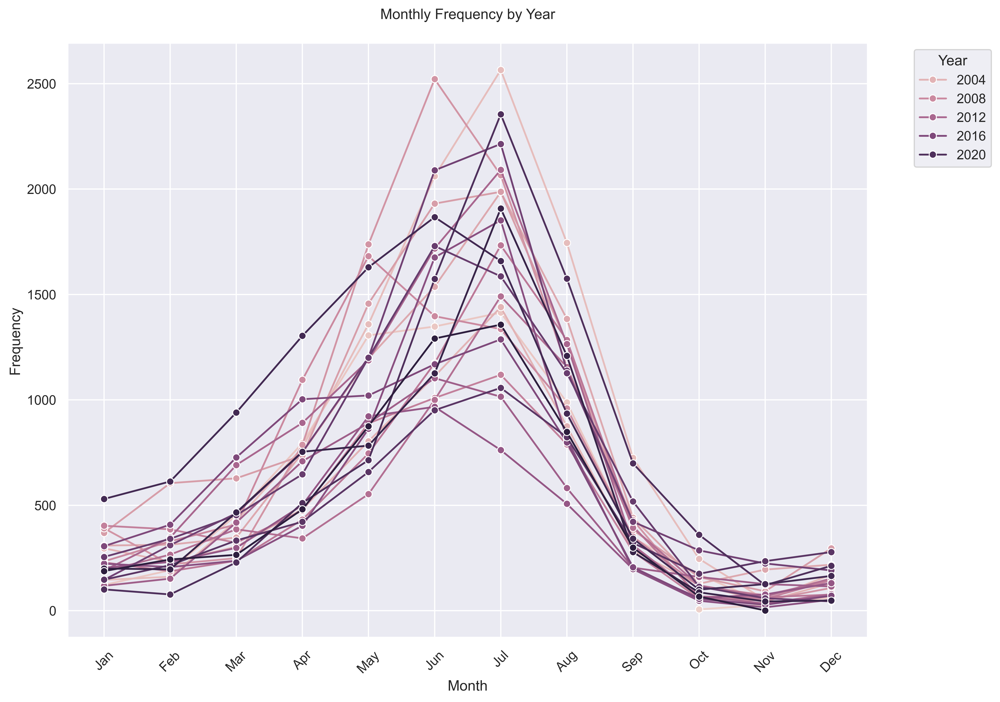

In [6]:
plot_date_frequency(pd.to_datetime(ngs_df['initialdate'])).show()

In [7]:
ngc_df = pd.read_csv('../assets/negative_class_random_complete.csv')
ngc_df.head()

,_uid_,id,longitude,latitude,initialdate,days
0,16.0,966855.0,-2.093528e+06,1.630820e+06,2001-12-29,0
1,19.0,966859.0,-1.630234e+06,1.215416e+06,2002-02-12,7
2,19.0,966859.0,-1.590190e+06,1.254799e+06,2002-01-16,7
3,17.0,966856.0,-2.101847e+06,1.721695e+06,2002-01-13,0
4,19.0,966859.0,-1.687368e+06,1.268341e+06,2001-12-24,7


/tmp/ipykernel_187542/1563983926.py:1: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  plot_date_frequency(pd.to_datetime(ngc_df['initialdate'])).show()


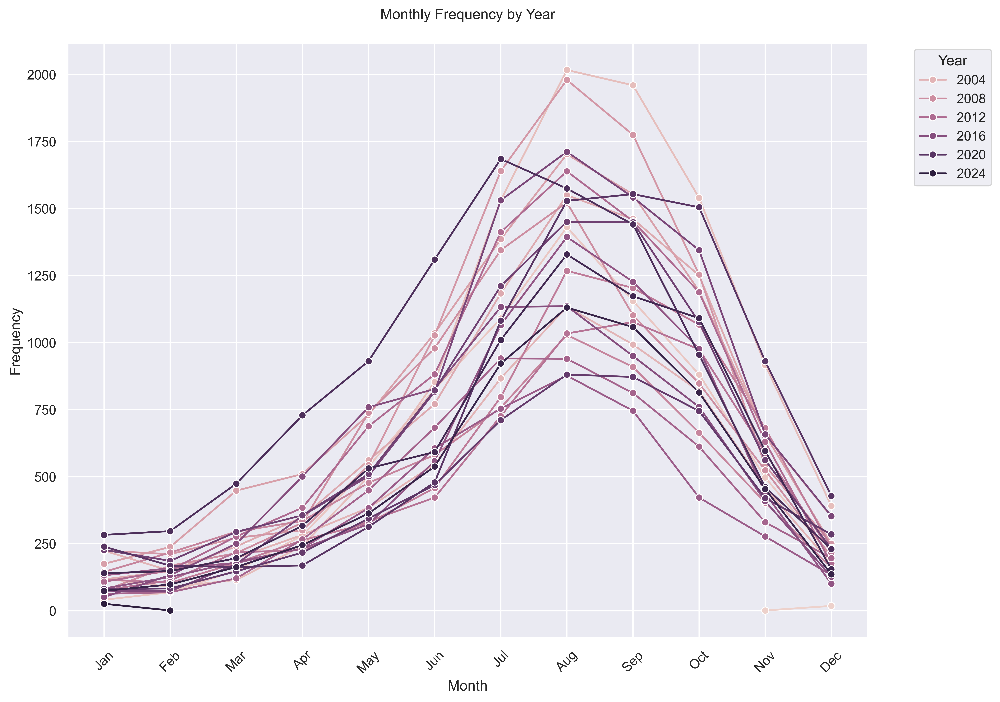

In [8]:
plot_date_frequency(pd.to_datetime(ngc_df['initialdate'])).show()

In [10]:
def plot_geo_distribution(df, figsize=(15, 10), cmap='viridis'):

    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=figsize)

    sns.kdeplot(
        data=df,
        x='longitude',
        y='latitude',
        fill=True,
        cmap=cmap,
        levels=20,
        ax=ax1
    )
    ax1.set_title('2D Density Distribution')
    ax1.set_xlabel('Longitude')
    ax1.set_ylabel('Latitude')

    sns.kdeplot(
        data=df,
        y='latitude',
        fill=True,
        color='blue',
        ax=ax2
    )
    ax2.set_title('Latitude Distribution')
    ax2.set_xlabel('Density')
    ax2.set_ylabel('Latitude')

    sns.kdeplot(
        data=df,
        x='longitude',
        fill=True,
        color='green',
        ax=ax3
    )
    ax3.set_title('Longitude Distribution')
    ax3.set_xlabel('Longitude')
    ax3.set_ylabel('Density')

    stats_text = (
        f"Latitude Summary:\n"
        f"Mean: {df['latitude'].mean():.2f}°\n"
        f"Std: {df['latitude'].std():.2f}°\n"
        f"Range: [{df['latitude'].min():.2f}°, {df['latitude'].max():.2f}°]\n\n"
        f"Longitude Summary:\n"
        f"Mean: {df['longitude'].mean():.2f}°\n"
        f"Std: {df['longitude'].std():.2f}°\n"
        f"Range: [{df['longitude'].min():.2f}°, {df['longitude'].max():.2f}°]"
    )

    plt.figtext(1.02, 0.5, stats_text, fontsize=10, va='center')

    plt.tight_layout()

    return fig

In [11]:
plot_geo_distribution(fire_df).show()

/tmp/ipykernel_187542/3553943261.py:1: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  plot_geo_distribution(fire_df).show()


In [12]:
plot_geo_distribution(ngs_df).show()

/tmp/ipykernel_187542/1718298667.py:1: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  plot_geo_distribution(ngs_df).show()


In [13]:
plot_geo_distribution(ngc_df).show()

/tmp/ipykernel_187542/2003081894.py:1: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  plot_geo_distribution(ngc_df).show()
